# EJERCICIO 1
Implemente una función que resuelva el problema cinemático directo para un manipulador RR, esto es, que calcule las coordenadas de la posición del extremo del robot dadas las variables de articulación. Use el siguiente esquema:
```
def pcd(q1, q2, l1, l2):
  <cálculo de x e y>
  return (x, y)
```
donde:

q1 es el ángulo de giro de la primera articulación (en radianes), q1.

q2 es el ángulo de giro de la segunda articulación (en radianes), q2.

l1 es la longitud del primer eslabón, l1.

l2 es la longitud del segundo eslabón, l2.

x es la coordenada x del extremo del robot.

y es la coordenada y del extremo del robot.

In [ ]:
import numpy as np

def pcd(q1, q2, l1, l2):
  # calcular las coordenadas x e y del extremo del robot
  x = l1*np.cos(q1) + l2*np.cos(q1 + q2)
  y = l1*np.sin(q1) + l2*np.sin(q1 + q2)
  return (x, y)

# EJERCICIO 2
Implemente una nueva función que, haciendo uso de la función pcd, dibuje la trayectoria seguida por el extremo del robot dadas unas variables de articulación concretas. La función debe tener la siguiente sintaxis:
```
def dibujar_trayectoria_pcd(q1s, q2s, l1, l2):
  <código de la función>
```
donde:

q1s es un vector con los ángulos de giro (en radianes) que debe tomar la
primera articulación a lo largo de la trayectoria.

q2s es un vector con los ángulos de giro (en radianes) que debe tomar la
segunda articulación a lo largo de la trayectoria.

l1 es la longitud del primer eslabón, l1.

l2 es la longitud del segundo eslabón, l2.

Para evitar que la trayectoria se vea distorsionada, centre el origen de coordenadas en la figura estableciendo una longitud máxima para cada eje de ±(l1 + l2 + 1).

In [1]:
import matplotlib.pyplot as plt
def dibujar_robot(q1, q2, l1, l2):
  x0, y0 = 0, 0 # Posición de la articulación 1
  x1, y1 = pcd(q1, 0, l1, 0) # Posición de la articulación 2
  x2, y2 = pcd(q1, q2, l1, l2) # Posición del extremo del robot
  x, y = [x0, x1, x2], [y0, y1, y2] # Coordenadas de la trayectoria
  plt.plot(x, y, "k") # Traza la trayectoria
  plt.plot(x0, y0, "k.") # Dibuja la articulación 1
  plt.plot(x1, y1, "k.") # Dibuja la articulación 2

def dibujar_trayectoria_pcd(q1s, q2s, l1, l2):
  # inicializar la lista de coordenadas
  pruebax = []
  pruebay = []
  coords = []
  # calcular las coordenadas para cada par de ángulos de giro
  for q1, q2 in zip(q1s, q2s):
      x, y = pcd(q1, q2, l1, l2)
      pruebax.append(x)
      pruebay.append(y)
      coords.append((x, y))
  # establecer los límites del gráfico
  max_length = l1 + l2 + 1
  plt.xlim(-max_length, max_length)
  plt.ylim(-max_length, max_length)
  # dibujar la trayectoria
  x_coords, y_coords = zip(*coords)
  plt.plot(x_coords, y_coords)
  #DIBUJO DEL ROBOT con los dos ultimos angulos de q1s y q2s
  dibujar_robot(q1s[-1], q2s[-1], l1, l2)

  #Se devuelve la trayectoria para después corroborar el correcto comportamiento de la cinemática inversa
  return pruebax, pruebay
  # mostrar el gráfico
  # plt.show()

# EJERCICIO 3
Al analizar la trayectoria, resulta de ayuda visualizar los eslabones del robot.
Para conseguirlo, implemente una tercera función que los dibuje junto a la trayectoria. Puede usar el siguiente código:
```
def dibujar_robot(q1, q2, l1, l2):
  x0, y0 = 0, 0 # Posición de la articulación 1
  x1, y1 = pcd(q1, 0, l1, 0) # Posición de la articulación 2
  x2, y2 = pcd(q1, q2, l1, l2) # Posición del extremo del robot
  x, y = [x0, x1, x2], [y0, y1, y2] # Coordenadas de la trayectoria
  plt.plot(x, y, ’k’) # Traza la trayectoria
  plt.plot(x0, y0, ’k.’) # Dibuja la articulación 1
  plt.plot(x1, y1, ’k.’) # Dibuja la articulación 2
```
Esta función debe ser llamada al 
final de la función dibujar_trayectoria_pcd,
introduciendo en q1 y q2 los últimos ángulos en q1s y q2s respectivamente.

# EJERCICIO 4
Compruebe el correcto funcionamiento de las funciones creadas en los ejercicios
anteriores trazando una trayectoria con 100 puntos en los que q1 vale siempre
π/4 y q2 toma valores entre 0 y π/2. Suponga que l1 = l2 = 2. Represente el
resultado. Debe ser similar al mostrado en la figura 1. Adicionalmente pruebe
con otros valores para q1 y q2 que generen trayectorias distintas.

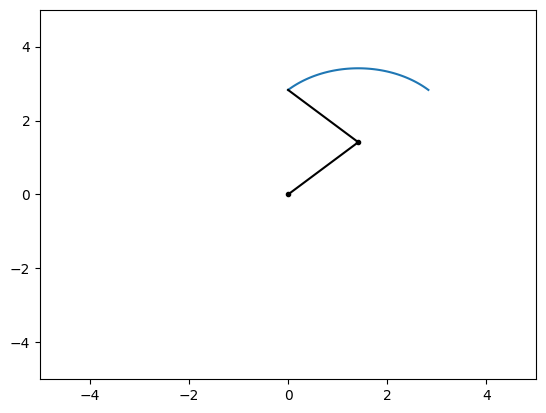

In [ ]:
l1 = l2 = 2

q2s = np.linspace(0, np.pi/2, 100)
q1s = np.full(100, np.pi/4)


pruebax, pruebay = dibujar_trayectoria_pcd(q1s, q2s, l1, l2)



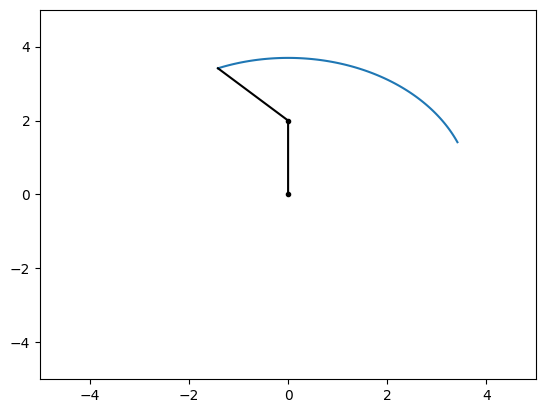

In [ ]:
#prueba con otros valores
nadax, naday = dibujar_trayectoria_pcd(q2s, q1s, l1, l2)

# EJERCICIO 5
Implemente una función que permita analizar el movimiento paso a paso.
Puede usar el siguiente código:
```
def animacion_trayectoria_pcd(q1s, q2s, l1, l2):
  n = min(len(q1s), len(q2s))
  for i in range(1,n):
    plt.cla()
    dibujar_trayectoria_pcd(q1s[0:i], q2s[0:i], l1, l2)
    plt.pause(0.001)
```




In [ ]:
from matplotlib import rc
rc('animation', html='jshtml')
from math import *
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import matplotlib.animation as animation
def animacion_trayectoria_pcd(q1s, q2s, l1, l2):

    fig = plt.figure(figsize=(8,6))
    ax = plt.axes()
    n = min(len(q1s), len(q2s))
    
    # inicializar la lista de coordenadas
    global coords
    coords = []
    # calcular las coordenadas para cada par de ángulos de giro
    for q1, q2 in zip(q1s, q2s):
        x, y = pcd(q1, q2, l1, l2)
        coords.append((x, y))
    # establecer los límites del gráfico
    global max_length
    max_length = l1 + l2 + 1
    global x_coords, y_coords
    x_coords = []
    y_coords = []
    
    global q1s_cop, q2s_cop
    q1s_cop = q1s.copy()
    q2s_cop = q2s.copy()
    def dibujar_trayectoria_pcd_mod(w):
      global q1s_cop
      global q2s_cop
      ax.clear()
      
      ax.set_xlim(-max_length, max_length)
      ax.set_ylim(-max_length, max_length)
      # x_coords, y_coords
      # dibujar la trayectoria
      elem = coords.pop(0)
      x_coords.append(elem[0])
      y_coords.append(elem[1])

      x0, y0 = 0, 0 # Posición de la articulación 1
      x1, y1 = pcd(q1s_cop[0], 0, l1, 0) # Posición de la articulación 2
      x2, y2 = pcd(q1s_cop[0], q2s_cop[0], l1, l2) # Posición del extremo del robot
      x, y = [x0, x1, x2], [y0, y1, y2] # Coordenadas de la trayectoria
      #Se van borrando los qs que se tomen
      q1s_cop = np.delete(q1s_cop,0)
      q2s_cop = np.delete(q2s_cop,0)

      ax.plot(x, y, "k") # Traza la trayectoria
      ax.plot(x0, y0, "k.") # Dibuja la articulación 1
      ax.plot(x1, y1, "k.") # Dibuja la articulación 2
      plot = ax.plot(x_coords, y_coords)
      #DIBUJO DEL ROBOT con los dos ultimos angulos de q1s y q2s
      

      # mostrar el gráfico
      #plt.show()
      return plot

    plt.close(fig)

    anim = animation.FuncAnimation(fig, dibujar_trayectoria_pcd_mod, frames=n-1,  blit=False, repeat=True)
    return anim

animacion_trayectoria_pcd(q1s, q2s, l1, l2)

NameError: ignored

# EJERCICIO 6
Utilice la función animacion_trayectoria_pcd para analizar la trayectoria realizada por el extremo del robot cuando q1 y q2 toman los siguientes valores:

q1 → 0, π/100, 2π/100, ..., π

q2 → 0, π/100, 2π/100, ..., 50π/100, 49π/100, 48π/100, ..., 0

In [ ]:
l1 = l2 = 2
q1s = np.arange(0, np.pi, np.pi/100)
q1s = np.append(q1s, np.pi)

q2s_prim = np.arange(0, 50*np.pi/100, np.pi/100)
q2s_sec = np.arange(50*np.pi/100, 0, -np.pi/100)
q2s = np.concatenate((q2s_prim, q2s_sec))
q2s = np.append(q2s, 0)

animacion_trayectoria_pcd(q1s, q2s, l1, l2)

Output hidden; open in https://colab.research.google.com to view.

# EJERCICIO 7
Implemente una función que resuelva el problema cinemático inverso para un
manipulador RR, esto es, que calcule las variables de articulación dadas las
coordenadas de la posición del extremo del robot. Use el siguiente esquema:


```
def pci(x, y, l1, l2):
  <cálculo de q1 y q2>
  return (q1, q2)
  donde:
```



x es la coordenada x del extremo del robot.

y es la coordenada y del extremo del robot.

l1 es la longitud del primer eslabón, l1.

l2 es la longitud del segundo eslabón, l2.

q1 es el ángulo de giro de la primera articulación (en radianes), q1.

q2 es el ángulo de giro de la segunda articulación (en radianes), q2.

Observe que, al contrario de lo que ocurre en la función que resuelve el problema cinemático directo, en esta ocasión los argumentos de entrada son las
coordenadas del extremo del robot y las longitudes de los eslabones, mientras
que los argumentos de salida son las variables de articulación.

In [ ]:
def pci2(x, y, l1, l2):
    r = np.sqrt(x**2 + y**2)
    #theta = np.arctan(y/x)
    theta = np.arctan2(y,x)
    alpha = np.arccos((l1**2 + l2**2 - r**2)/(2*l1*l2))
    q2 = np.pi - alpha
    beta = np.arcsin(l2*np.sin(alpha)/r)
    q1 = theta - beta
    return (q1, q2)

#Version final
def pci(x, y, l1, l2):
  #Se hacen todas las cuentas en base a las transparencias
    COSQ2 = (x**2+y**2-l1**2-l2**2)/(2*l1*l2)
    SINQ2  = np.sqrt(1- COSQ2**2)
    q2 = np.arctan2(SINQ2, COSQ2)

    gamma1 = np.arctan2(y,x)
    beta1 = np.arctan2(l2*SINQ2,l1+l2*COSQ2)
    q1 = gamma1-beta1
   
    return q1,q2

#Versión con arctan, para usarla, quitar el 3 del final y añadir un número
#a la función pci de arriba para inutilizarla
def pci3(x, y, l1, l2):
    COSQ2 = (x**2+y**2-l1**2-l2**2)/(2*l1*l2)
    SINQ2  = np.sqrt(1- COSQ2**2)
    q2 = np.arctan(SINQ2/COSQ2)

    gamma1 = np.arctan(y/x)
    beta1 = np.arctan(l2*SINQ2/l1+l2*COSQ2)
    q1 = gamma1-beta1
   
    return q1,q2

# EJERCICIO 8

Implemente las funciones equivalentes a dibujar_trayectoria_pcd y animacion_trayectoria_pcd para el problema cinemático inverso. La sintaxis de las mismas se muestra a continuación:


```
def dibujar_trayectoria_pci(xs, ys, l1, l2):
  <código de la función>
  def animacion_trayectoria_pci(xs, ys, l1, l2):
  <código de la función>

```

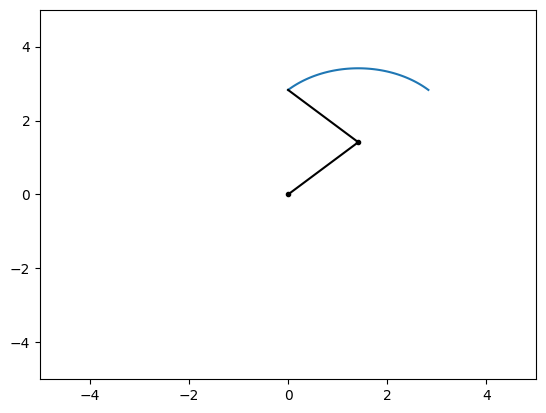

In [ ]:
#A dibujar robot ahora se le pasa las coordenadas de trayectoria en vez de las variables de articulación
def dibujar_robot(x, y, l1, l2):
  x0, y0 = 0, 0 # Posición de la articulación 1
  q1, q2 = pci(x, y, l1, l2) # Posición de la articulación 2
  x1 = l1*np.cos(q1)
  y1 = l1*np.sin(q1)
  x2, y2 = x, y # Posición del extremo del robot
  x, y = [x0, x1, x2], [y0, y1, y2] # Coordenadas de la trayectoria
  plt.plot(x, y, "k") # Traza la trayectoria
  plt.plot(x0, y0, "k.") # Dibuja la articulación 1
  plt.plot(x1, y1, "k.") # Dibuja la articulación 2

def dibujar_trayectoria_pci(x1s, x2s, l1, l2):
  # inicializar la lista de coordenadas
  coords = []
  # calcular las coordenadas para cada par de ángulos de giro
  for x1, x2 in zip(x1s, x2s):
      coords.append((x1, x2))
  # establecer los límites del gráfico
  max_length = l1 + l2 + 1
  plt.xlim(-max_length, max_length)
  plt.ylim(-max_length, max_length)
  # dibujar la trayectoria
  x_coords, y_coords = zip(*coords)
  plt.plot(x_coords, y_coords)
  #DIBUJO DEL ROBOT con los dos ultimos angulos de q1s y q2s
  dibujar_robot(x1s[-1], x2s[-1], l1, l2)
  # mostrar el gráfico
  plt.show()



dibujar_trayectoria_pci(pruebax, pruebay, l1, l2)

In [ ]:
def animacion_trayectoria_pci(xs, ys, l1, l2):

    fig = plt.figure(figsize=(8,6))
    ax = plt.axes()
    n = min(len(xs), len(ys))
    
    # inicializar la lista de coordenadas
    global coords
    coords = []
    # calcular las coordenadas para cada par de ángulos de giro
    for x, y in zip(xs, ys):
        coords.append((x, y))
    # establecer los límites del gráfico
    global max_length
    max_length = l1 + l2 + 1
    global x_coords, y_coords
    x_coords = []
    y_coords = []
    global q1s, q2s
    q1s = []
    q2s = []
    
    def dibujar_trayectoria_pci_mod(w):
      global q1s, q2s
      ax.clear()
      
      ax.set_xlim(-max_length, max_length)
      ax.set_ylim(-max_length, max_length)
      # x_coords, y_coords
      # dibujar la trayectoria
      elem = coords.pop(0)
      x_coords.append(elem[0])
      y_coords.append(elem[1])

      x0, y0 = 0, 0 # Posición de la articulación 1
      q1, q2 = pci(x_coords[-1], y_coords[-1], l1, l2) # Posición de la articulación 2
      q1s.append(q1)
      q2s.append(q2)
      x1 = l1*np.cos(q1)
      y1 = l1*np.sin(q1)
      x2, y2 = x_coords[-1], y_coords[-1] # Posición del extremo del robot
      x, y = [x0, x1, x2], [y0, y1, y2] # Coordenadas de la trayectoria
      x, y = [x0, x1, x2], [y0, y1, y2] # Coordenadas de la trayectoria

      ax.plot(x, y, "k") # Traza la trayectoria
      ax.plot(x0, y0, "k.") # Dibuja la articulación 1
      ax.plot(x1, y1, "k.") # Dibuja la articulación 2
      plot = ax.plot(x_coords, y_coords)
      #DIBUJO DEL ROBOT con los dos ultimos angulos de q1s y q2s
      

      # mostrar el gráfico
      #plt.show()
      return plot

    plt.close(fig)

    anim = animation.FuncAnimation(fig, dibujar_trayectoria_pci_mod, frames=n-1,  blit=False, repeat=True)
    return anim, q1s, q2s
anim, q1s, q2s = animacion_trayectoria_pci(pruebax, pruebay, l1, l2)
anim

# EJERCICIO 9
Compruebe que dibujar_trayectoria_pci y animacion_trayectoria_pci funcionan correctamente analizando el valor de las variables articulares cuando el extremo
del robot se mueve:

Desde el punto (2, 0) hasta el punto (0, 2) en línea recta.

Desde el punto (1, 1) hasta el punto (−2, 1) en línea recta.

Desde el punto (1, 0) hasta el punto (−1, 0) en línea recta.

Desde el punto (−2, 0) hasta el punto (2, 1) en línea recta.

Si al resolver el problema cinemático inverso ha calculado el arcotangente usando la función arctan de numpy, el robot se comportará de modo extraño al trazar las trayectorias anteriores. Para evitarlo use la función arctan2 y compare su funcionamiento con el de la función arctan. ¿A qué se debe la diferencia?

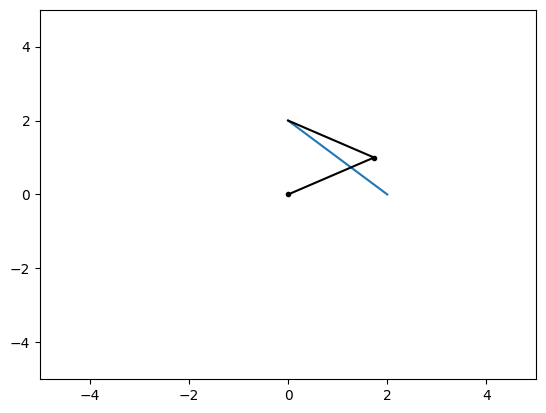

In [ ]:
#Función con la ecuación de la recta para calcular las y en base a unas x dadas

#Ejemplo 1
x = np.linspace(2,0,100)
y = recta(x,2,0,0,2)
dibujar_trayectoria_pci(x, y, l1, l2)
anim, q1s, q2s = animacion_trayectoria_pci(x, y, l1, l2)
anim




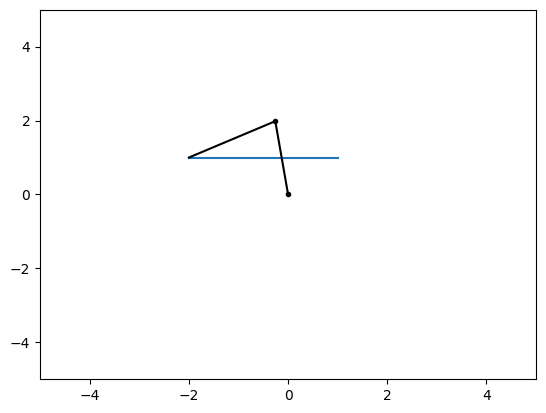

In [ ]:
#Ejemplo 2
x = np.linspace(1,-2,100)
y = recta(x,1,1,-2,1)
dibujar_trayectoria_pci(x, y, l1, l2)
anim, q1s, q2s = animacion_trayectoria_pci(x, y, l1, l2)
anim

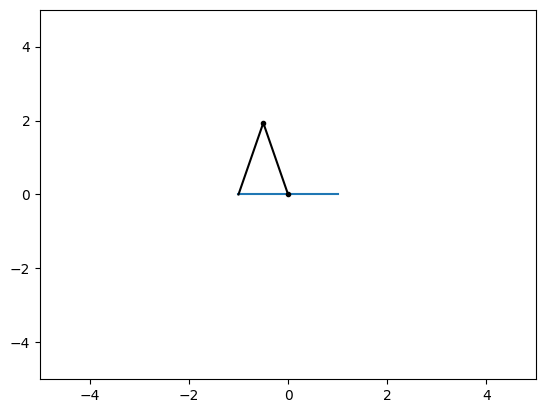

In [ ]:
#Ejemplo 3
x = np.linspace(1,-1,100)
y = recta(x,1,0,-1,0)
dibujar_trayectoria_pci(x, y, l1, l2)
anim, q1s_3, q2s_3 = animacion_trayectoria_pci(x, y, l1, l2)
anim


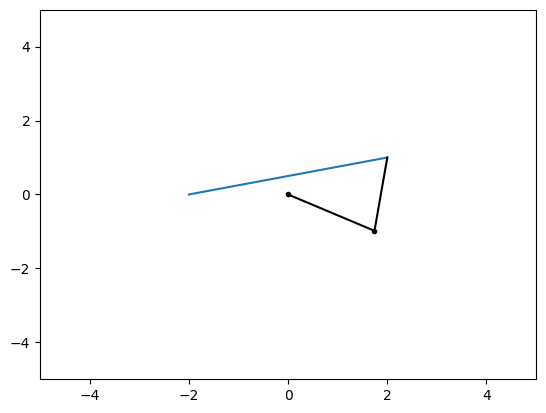

In [ ]:
#Ejemplo 4
x = np.linspace(-2,2,100)
y = recta(x,-2,0,2,1)
dibujar_trayectoria_pci(x, y, l1, l2)
anim, q1s_4, q2s_4 = animacion_trayectoria_pci(x, y, l1, l2)
anim

#EJERCICIO 10
Modi
que la función pci para que devuelva todas las soluciones posibles y
a continuación adapte la función dibujar_trayectoria_pci para que escoja la mejor solución de todas las que devuelva pci. Veri
que su funcionamiento volviendo a analizar las trayectorias del ejercicio anterior.

[-1.318116071652818, -1.323328726593098, -1.3285345256354466, -1.3337336362918106, -1.3389262242789182, -1.3441124535743147, -1.3492924864710247, -1.3544664836308915, -1.3596346041366452, -1.3647970055427592, -1.3699538439251329, -1.3751052739296572, -1.3802514488197024, -1.3853925205225768, -1.3905286396749936, -1.3956599556675928, -1.4007866166885512, -1.405908769766323, -1.4110265608115475, -1.4161401346581557, -1.4212496351037154, -1.4263552049490447, -1.431456986037127, -1.4365551192913588, -1.44164974475316, -1.4467410016189803, -1.4518290282767212, -1.4569139623416134, -1.4619959406915648, -1.4670750995020159, -1.4721515742803193, -1.4772254998996772, -1.4822970106326518, -1.4873662401842818, -1.4924333217248207, -1.4974983879221262, -1.502561570973718, -1.5076230026385284, -1.51268281426837, -1.5177411368391327, -1.522798100981744, -1.5278538370129018, -1.5329084749656068, -1.5379621446195104, -1.5430149755311013, -1.5480670970637473, -1.5531186384176148, -1.5581697286594884, -

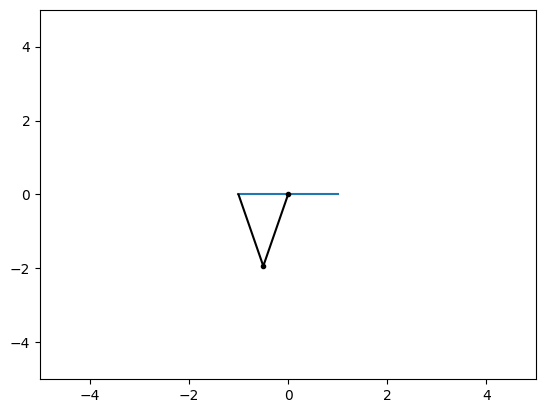

In [ ]:
print(q1s_3)
print(q2s_3)
def dist_angulos(angulo1,angulo2):
  diff = (angulo2 - angulo1) % (2 * np.pi)
  return diff if diff <= np.pi else (2 * np.pi - diff)
  #Si la diferencia es mayor que pi, entonces se devuelve la 
  #diferencia entre 2*pi y la diferencia calculada en la primera línea, 
  #ya que es más corto dar la vuelta completa alrededor del círculo en la dirección opuesta.
  return dife

#Pci modificado, se toma la versión negativa del seno
def pci(x, y, l1, l2):
    D = (x**2+y**2-l1**2-l2**2)/(2*l1*l2)
    S = np.sqrt(1-D**2)
    q2_1 = np.arctan2(S, D)
    q2_2 = np.arctan2(-S, D)
    gamma1 = np.arctan2(y,x)
    beta1 = np.arctan2(l2*S,l1+l2*D)
    q1_1 = gamma1-beta1
    gamma2 = np.arctan2(y,x)
    beta2 = np.arctan2(-l2*S,l1+l2*D)
    q1_2 = gamma2-beta2 
    return [(q1_1, q2_1), (q1_2, q2_2)]

#Prueba que se hizo, no tener en cuenta
def pci2(x, y, l1, l2):
    # r = np.sqrt(x**2 + y**2)
    # theta = np.arctan2(y,x)
    # alpha = np.arccos((l1**2 + l2**2 - r**2)/(2*l1*l2))
    # beta = np.arcsin(l2*np.sin(alpha)/r)
    
    # # Calculate the two possible solutions for q2
    # q2_1 = np.pi - alpha
    # q2_2 = -q2_1
    
    # # Calculate the two possible solutions for q1
    # q1_1 = theta - np.arctan2(l2*np.sin(alpha), l1 + l2*np.cos(alpha))
    # q1_2 = theta - np.arctan2(l2*np.sin(alpha), l1 + l2*np.cos(alpha)) + np.pi
    
    # # # Adjust angles to be within [-pi, pi] range
    # # q1_1 = (q1_1 + np.pi) % (2 * np.pi) - np.pi
    # # q1_2 = (q1_2 + np.pi) % (2 * np.pi) - np.pi
    
    # # Return all possible solutions as a list of tuples
    # return [(q1_1, q2_1), (q1_2, q2_2)]
    
    
    # return (q1, q2)
    r = np.sqrt(x**2 + y**2)
    theta = np.arctan(y/x)
    alpha = np.arccos((l1**2 + l2**2 - r**2)/(2*l1*l2))
    q2_1 = np.pi - alpha
    q2_2 = -q2_1
    beta1 = np.arcsin(l2*np.sin(alpha)/r)
    beta2 = np.pi - beta1
    q1_1 = theta - beta1
    q1_2 = theta - beta2
    return [(q1_1, q1_2), (q2_1, q2_2)]



#Se le pasan todos los parametros directamente
def dibujar_robot(q1,q2, l1, l2, x, y):
  x0, y0 = 0, 0 # Posición de la articulación 1

  # qs= pci(x, y, l1, l2) # Posición de la articulación 2
  # q1s = qs[0]
  # q2s = qs[1]

  # if(q1s[0] - q1_ant > q1s[1] - q1_ant):
  #   q1 = q1s[1]
  # else:
  #   q1 = q1s[0]
  # if(q2s[0] - q2_ant > q2s[1] - q2_ant):
  #   q2 = q2s[1]
  # else:
  #   q2 = q2s[0]

  x1 = l1*np.cos(q1)
  y1 = l1*np.sin(q1)
  x2, y2 = x, y # Posición del extremo del robot
  x, y = [x0, x1, x2], [y0, y1, y2] # Coordenadas de la trayectoria
  plt.plot(x, y, "k") # Traza la trayectoria
  plt.plot(x0, y0, "k.") # Dibuja la articulación 1
  plt.plot(x1, y1, "k.") # Dibuja la articulación 2


def dibujar_trayectoria_pci(x1s, x2s, l1, l2,solu):
  # inicializar la lista de coordenadas
  coords = []
  # calcular las coordenadas para cada par de ángulos de giro
  qs = []
  q_prim = []
  q_sec = []

  q_def = []
  q1_def = []
  q2_def = []
  for x1, x2 in zip(x1s, x2s):
      qs.append(pci(x1,x2,l1,l2))
      coords.append((x1, x2))
  for q in qs:
    q_prim.append(q[0]) #primer par
    q_sec.append(q[1])  #segundo par
  prim = True
  for u, v in zip(q_prim, q_sec):
    if(prim):
      prim = False
      # rand = np.random.randint(0,2)
      #Si es la primera iteración, se añade el par que se haya indicado como parámetro y se guarda como q_ant
      if(solu == 0):
        q_def.append(u)
        q_ant = u
      else:
        q_def.append(v)
        q_ant = v
      # q1_def.append(q[rand])
      # q2_def.append()
      # q1_ant = q[rand]
    #Si no, se calculan la distancia entre q1_ant y q1 y entre q2_ant y q2 para los dos pares de soluciones y se toma el que sume menos
    else:
      dist1 = np.array([dist_angulos(q_ant[0],u[0]), dist_angulos(q_ant[1],u[1])])
      dist2 = np.array([dist_angulos(q_ant[0],v[0]), dist_angulos(q_ant[1],v[1])])
      if (dist1.sum(axis=0) > dist2.sum(axis=0)):
        q_def.append(v)
        q_ant = v
      else:
        q_def.append(u)
        q_ant = u
      # if(abs(q1[0] - q1_ant) > abs(q1[1] - q1_ant)):
      #   q1_def.append(q1[1])
      #   q1_ant = q1[1]
      # else:
      #   q1_def.append(q1[0])
      #   q1_ant = q1[0]
  # prim = True
  # for q2 in q2s:
  #   print(q2)
  #   if(prim):
  #     prim = False
  #     rand = np.random.randint(0,1)
  #     q2_def.append(q2[rand])
  #     q2_ant = q2[rand]
  #   else:
  #     if(abs(q2[0] - q2_ant) > abs(q2[1] - q2_ant)):
  #       q2_def.append(q2[1])
  #       q2_ant = q2[1]
  #     else:
  #       q2_def.append(q2[0])
  #       q2_ant = q2[0]
  # print(q1_def)
  # print(q2_def)



  # establecer los límites del gráfico
  max_length = l1 + l2 + 1
  plt.xlim(-max_length, max_length)
  plt.ylim(-max_length, max_length)
  # dibujar la trayectoria
  x_coords, y_coords = zip(*coords)
  plt.plot(x_coords, y_coords)
  #DIBUJO DEL ROBOT con los dos ultimos angulos de q1s y q2s
  dibujar_robot(q_def[-1][0], q_def[-1][1], l1, l2, x_coords[-1], y_coords[-1])
  # mostrar el gráfico
  plt.show()

x = np.linspace(1,-1,100)
y = recta(x,1,0,-1,0)
dibujar_trayectoria_pci(x, y, l1, l2, 0)


#Para esta, la comprobación de cuál es la mejor solución en cada momento
#se hace en la llamada recursiva a dibujar_trayectoria_pci_mod
#para ello se crean diversas variables globales
def animacion_trayectoria_pci(xs, ys, l1, l2, solu):

    fig = plt.figure(figsize=(8,6))
    ax = plt.axes()
    n = min(len(xs), len(ys))
    
    # inicializar la lista de coordenadas
    global coords
    coords = []
    # calcular las coordenadas para cada par de ángulos de giro
    for x, y in zip(xs, ys):
        coords.append((x, y))
    # establecer los límites del gráfico
    global max_length
    max_length = l1 + l2 + 1
    global x_coords, y_coords
    x_coords = []
    y_coords = []

    #Variables globales para ir guardando todo
    global q1s, q2s, q_def, q_ant
    q1s = []
    q2s = []
    q_def = []

    #Global para ver si es la primera iteración
    global primero
    primero = True
    
    def dibujar_trayectoria_pci_mod(w):
      global q1s, q2s, q_def, q_ant
      global primero
      ax.clear()
      
      ax.set_xlim(-max_length, max_length)
      ax.set_ylim(-max_length, max_length)
      # x_coords, y_coords
      # dibujar la trayectoria
      elem = coords.pop(0)
      x_coords.append(elem[0])
      y_coords.append(elem[1])

      
      x0, y0 = 0, 0 # Posición de la articulación 1
      qs = pci(x_coords[-1], y_coords[-1], l1, l2) # Posición de la articulación 2
      q_prim = qs[0]
      q_sec = qs[1]

      if(primero):
        #Si es la primera iteración (llamada a la función), se toma la solución que se indique como parámetro
        primero = False
        # rand = np.random.randint(0,2)
        if(solu == 0):
          q_def.append(q_prim)
          q_ant = q_prim
        else:
          q_def.append(q_sec)
          q_ant = q_sec
        # rand = np.random.randint(0,2)
        # q1  = q1_2[rand]
        # q2  = q2_2[rand]
        # q1s.append(q1)
        # q2s.append(q2)

      #En caso de que no se compara con la anterior como ya se ha indicado en esta práctica
      else:
        dist1 = np.array([dist_angulos(q_ant[0],q_prim[0]), dist_angulos(q_ant[1],q_prim[1])])
        dist2 = np.array([dist_angulos(q_ant[0],q_sec[0]), dist_angulos(q_ant[1],q_sec[1])])
        if(dist1.sum(axis=0) > dist2.sum(axis=0)):
          q_def.append(q_sec)
          q_ant = q_sec
        else:
          q_def.append(q_prim)
          q_ant = q_prim
        # if(dist_angulos(q_prim[0],q_ant[0]) > dist_angulos(q_sec[0],q_ant[0]):
        #   q1 = q1_2[1]
        #   q1s.append(q1)
        # else:
        #   q1 = q1_2[0]
        #   q1s.append(q1)
        # if(abs(q2_2[0] - q2s[-1]) > abs(q2_2[1] - q2s[-1])):
        #   q2 = q2_2[1]
        #   q2s.append(q2)
        # else:
        #   q2 = q2_2[0]
        #   q2s.append(q2)

      #Se dibuja el robot directamente sin llamar a la función
      x1 = l1*np.cos(q_def[-1][0])
      y1 = l1*np.sin(q_def[-1][0])
      x2, y2 = x_coords[-1], y_coords[-1] # Posición del extremo del robot
      x, y = [x0, x1, x2], [y0, y1, y2] # Coordenadas de la trayectoria
      x, y = [x0, x1, x2], [y0, y1, y2] # Coordenadas de la trayectoria

      ax.plot(x, y, "k") # Traza la trayectoria
      ax.plot(x0, y0, "k.") # Dibuja la articulación 1
      ax.plot(x1, y1, "k.") # Dibuja la articulación 2
      plot = ax.plot(x_coords, y_coords)
      #DIBUJO DEL ROBOT con los dos ultimos angulos de q1s y q2s
      

      # mostrar el gráfico
      #plt.show()
      return plot

    plt.close(fig)

    anim = animation.FuncAnimation(fig, dibujar_trayectoria_pci_mod, frames=n-1,  blit=False, repeat=True)
    return anim, q1s, q2s


In [ ]:
#Ejemplo 3
x = np.linspace(1,-1,100)
y = recta(x,1,0,-1,0)
anim, q1s, q2s = animacion_trayectoria_pci(x, y, l1, l2, 1)
anim

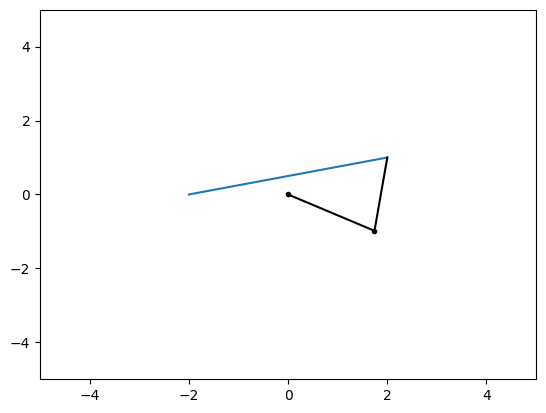

In [ ]:
#Ejemplo 4
x = np.linspace(-2,2,100)
y = recta(x,-2,0,2,1)
dibujar_trayectoria_pci(x, y, l1, l2, 0)
anim, q1s_4, q2s_4 = animacion_trayectoria_pci(x, y, l1, l2, 0)
anim

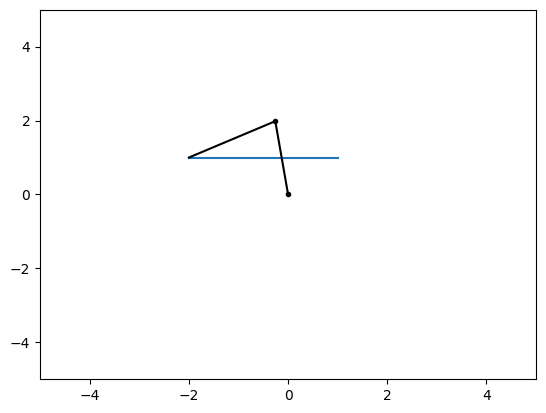

In [ ]:
#Ejemplo 2
x = np.linspace(1,-2,100)
y = recta(x,1,1,-2,1)
dibujar_trayectoria_pci(x, y, l1, l2, 0)
anim, q1s, q2s = animacion_trayectoria_pci(x, y, l1, l2, 0)
anim

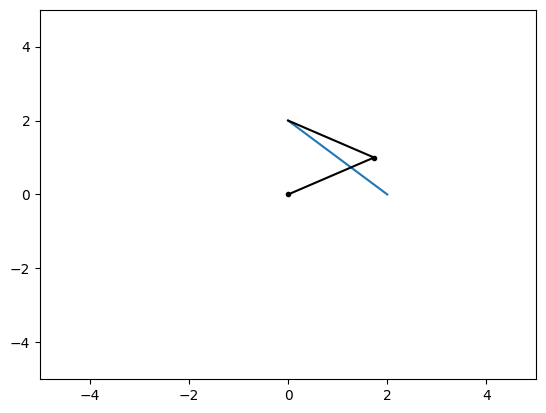

In [ ]:
#Ejemplo 1
x = np.linspace(2,0,100)
y = recta(x,2,0,0,2)
dibujar_trayectoria_pci(x, y, l1, l2, 0)
anim, q1s, q2s = animacion_trayectoria_pci(x, y, l1, l2, 0)
anim